# Figure 2: Cerebellum-specfic ALE (C-SALE) maps for Behavioural Subdomains, 
## Full unthresholded maps with thresholded (p < 0.001 and k = 50) overlays. 

#### Author: Neville Magielse
#### Date: 25.07.2024

In [9]:
import os
import sys

# User-specified base working directory
BASE_DIR = '/data/project/cerebellum_ale/'  # Change this to your project folder. Make sure they have input and output folders.

# Defines input and output paths.
INPUT_DIR = os.path.join(BASE_DIR, 'input')
OUTPUT_DIR = os.path.join(BASE_DIR, 'output')

sys.path.append(os.path.join(BASE_DIR, 'scripts'))

In [10]:
# Imports
import numpy as np
import pandas as pd

import scipy
import scipy.spatial

import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch
import matplotlib.cm

import seaborn as sns
import nilearn.plotting, nilearn.maskers, nilearn.surface
import nibabel as nib

import nimare
from nimare.meta.cbma.ale import ALE
from nimare.correct import FWECorrector

# sys.path.append(os.path.join(BASE_DIR, 'scripts')). Utils is a custom python file with somme functions defined for this project.
from utils import cluster_extent_correction

import SUITPy.flatmap

from itertools import islice

In [11]:
# Create a font language
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Import C-SALE data

In [8]:
# Create dictionaires
zmaps = {}
surf_zmaps = {}
zmaps_thr = {}
surf_zmaps_thr = {}
zmaps_thr_strict = {}
surf_zmaps_thr_strict = {}

domains = ['Action', 'Cognition', 'Emotion', 'Perception', 'Interoception'] # Only domains are necessary, since we automatically include all directories (assuming these are all subdomains).
# subdomains = ['Execution', 'Execution.Speech', 'Imagination', 'Inhibition', 'MotorLearning', 'Observation', 'Preparation', 'Attention', 'Language', 'Language.Orthography', 'Language.Phonology', 'Language.Semantics', 'Language.Speech', 'Language.Syntax','Memory', 'Memory.Explicit', 'Memory.Working','Music', 'Reasoning', 'SocialCognition', 'Spatial', 'Temporal', 'Negative', 'Negative.Anger', 'Negative.Anxiety', 'Negative.Disgust', 'Negative.Fear', 'Negative.Sadness', 'Positive', 'Positive.Happiness', 'Positive.RewardGain', 'Valence', 'Hunger', 'RespirationRegulation', 'Sexuality', 'Audition', 'Gustation', 'Olfaction', 'Somesthesis', 'Somesthesis.Pain','Vision', 'Vision.Color','Vision.Motion', 'Vision.Shape']
MASK_NAME = 'D2009_MNI'
mask_img = os.path.join(INPUT_DIR, f'maps/{MASK_NAME}.nii.gz')
k = 50

all_subdomains = []  # Initialize an empty list to store all subdomains

for domain in domains:
    domain_path = os.path.join(OUTPUT_DIR, 'SALE', f'{domain}')
    all_domains = os.listdir(domain_path)
    
    # Exclude subdomains with the same name as the domains
    subdomains = [subdomain for subdomain in all_domains if subdomain not in domains]
    all_subdomains.extend(subdomains)  # Add the subdomains to the list
    
    for subdomain in subdomains:
        subdomain_path = os.path.join(domain_path, subdomain)
        if (not os.path.isdir(subdomain_path)):
            continue
        print(subdomain)
        # load uncorrected results
        z_orig = nib.load(os.path.join(subdomain_path, 'uncorr_z.nii.gz'))
        # mask to the proper mask
        z_masked = nilearn.image.math_img("m * img", img=z_orig, m=mask_img)
        # record 3d and flattened unthresholded images
        zmaps[subdomain] = z_masked
        surf_zmaps[subdomain] = SUITPy.flatmap.vol_to_surf(zmaps[subdomain], space = 'SPM').squeeze()
        # do cluster extent thresholding if needed
        corr_cluster_z_path = os.path.join(subdomain_path, f'corr_cluster_h-01_k-{k}_mask-{MASK_NAME}_z.nii.gz')
        corr_cluster_z_path_strict = os.path.join(subdomain_path, f'corr_cluster_h-001_k-{k}_mask-{MASK_NAME}_z.nii.gz')
        if not os.path.exists(corr_cluster_z_path):
            logp_orig = nib.load(os.path.join(subdomain_path, 'uncorr_logp.nii.gz'))
            logp_masked = nilearn.image.math_img("m * img", img=logp_orig, m=mask_img)
            # cluster extent correction
            cres = cluster_extent_correction({'z': z_masked, 'logp': logp_masked}, k=50, height_thr=0.01)
            # save corrected results
            for map_name, img in cres.items():
                img.to_filename(os.path.join(subdomain_path, f'corr_cluster_h-01_k-{k}_mask-{MASK_NAME}_{map_name}.nii.gz'))
        # record 3d and flattened leniently thresholded (p < 0.01  and K = 50) images
        zmaps_thr[subdomain] = nib.load(corr_cluster_z_path)
        surf_zmaps_thr[subdomain] = SUITPy.flatmap.vol_to_surf(zmaps_thr[subdomain], space ='SPM').squeeze()
        # record 3d and flattened thresholded (Strict, p < 0.001 and K = 50) images
        zmaps_thr_strict[subdomain] = nib.load(corr_cluster_z_path_strict)
        surf_zmaps_thr_strict[subdomain] = SUITPy.flatmap.vol_to_surf(zmaps_thr_strict[subdomain], space = 'SPM').squeeze()

Action.MotorLearning
Action.Observation
Action.Execution.Speech
Action.Inhibition
Action.Execution
Action.Preparation
Action.Imagination
Cognition.Spatial
Cognition.SocialCognition
Cognition.Attention
Cognition.Language.Syntax
Cognition.Memory
Cognition.Memory.Explicit
Cognition.Language
Cognition.Language.Semantics
Cognition.Memory.Working
Cognition.Language.Phonology
Cognition.Reasoning
Cognition.Temporal
Cognition.Language.Speech
Cognition.Language.Orthography
Cognition.Music
Emotion.Positive.RewardGain
Emotion.Negative.Disgust
Emotion.Positive
Emotion.Negative.Fear
Emotion.Positive.Happiness
Emotion.Negative.Sadness
Emotion.Negative
Emotion.Valence
Emotion.Negative.Anger
Emotion.Negative.Anxiety
Perception.Vision
Perception.Olfaction
Perception.Vision.Motion
Perception.Gustation
Perception.Somesthesis.Pain
Perception.Audition
Perception.Somesthesis
Perception.Vision.Color
Perception.Vision.Shape
Interoception.Sexuality
Interoception.RespirationRegulation
Interoception.Hunger


# Create Figure 2

## Choose colors

In [12]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# cmap_hex = ['#3498db', '#e67e22', '#9b59b6', '#f1c40f', '#008080', '#e91e63', '#8b4513', '#00bcd4', '#800000', '#808000', '#4b0082', '#ffc0cb', '#e6e6fa', '#708090', '#98fb98']
# cmap_hex = ['#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6', '#bfef45', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#a9a9a9', '#ffffff', '#000000']
#cmap_hex = ['#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#42d4f4', '#f032e6', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3', '#000075', '#a9a9a9', '#ffffff', '#000000']
# cmap_hex (no greens) = ['#e6194B', '#4363d8', '#f58231', '#42d4f4', '#f032e6', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#000075', '#a9a9a9','#ffe119', '#ffffff', '#000000']
# cmap_hex = ['#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6', '#bfef45', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#a9a9a9', '#ffffff', '#000000'] # no red
cmap_hex = ['#ffe119', '#4363d8', '#f58231', '#dcbeff', '#800000', '#000075', '#a9a9a9', '#ffffff', '#000000'] # Works for 99.99%: https://sashamaps.net/docs/resources/20-colors/

# Convert hex codes to RGB
cmap_rgb = [tuple(int(code[i:i+2], 16) / 255.0 for i in (1, 3, 5)) for code in cmap_hex]

# Create ListedColormap
custom_cmap = ListedColormap(cmap_rgb)

# Example usage:
# plt.imshow(data, cmap=custom_cmap)
# plt.colorbar()
# plt.show()


In [13]:
# Choose what colormap you want to use (we recycle the same colormap, since it has nice, high contrast colors that are 99.99% color blind-frindly (first 5 colors)
chosen_cmap = custom_cmap

## Create label mapping and semantic categories

In [14]:
# Add nicer labels to the sets of experiments/subdomains.
subdomain_labels = {'Action.MotorLearning': 'Motor Learning',
                  'Action.Observation': 'Observation',
                  'Action.Execution.Speech': 'Speech Execution',
                  'Action.Inhibition': 'Inhibition',
                  'Action.Execution': 'Execution',
                  'Action.Preparation': 'Preparation',
                  'Action.Imagination': 'Imagination',
                  'Cognition.Spatial': 'Spatial',
                  'Cognition.SocialCognition': 'Social Cognition',
                  'Cognition.Attention': 'Attention',
                  'Cognition.Language.Syntax': 'Syntax',
                  'Cognition.Memory': 'Memory',
                  'Cognition.Memory.Explicit': 'Explicit Memory',
                  'Cognition.Language': 'Language',
                  'Cognition.Language.Semantics': 'Semantics',
                  'Cognition.Memory.Working': 'Working Memory',
                  'Cognition.Language.Phonology': 'Phonology',
                  'Cognition.Reasoning': 'Reasoning',
                  'Cognition.Temporal': 'Temporal',
                  'Cognition.Language.Speech': 'Speech',
                  'Cognition.Language.Orthography': 'Orthography',
                  'Cognition.Music': 'Music',
                  'Emotion.Positive.RewardGain': 'Reward/ Gain',
                  'Emotion.Negative.Disgust': 'Disgust',
                  'Emotion.Positive': 'Positive Emotion',
                  'Emotion.Negative.Fear': 'Fear',
                  'Emotion.Positive.Happiness': 'Happiness',
                  'Emotion.Negative.Sadness': 'Sadness',
                  'Emotion.Negative': 'Negative Emotion',
                  'Emotion.Valence': 'Valence',
                  'Emotion.Negative.Anger': 'Anger',
                  'Emotion.Negative.Anxiety': 'Anxiety',
                  'Perception.Vision': 'Vision',
                  'Perception.Olfaction': 'Olfaction',
                  'Perception.Vision.Motion': 'Vision - Motion',
                  'Perception.Gustation': 'Gustation',
                  'Perception.Somesthesis.Pain': 'Pain',
                  'Perception.Audition': 'Audition',
                  'Perception.Somesthesis': 'Somesthesis',
                  'Perception.Vision.Color': 'Vision - Color',
                  'Perception.Vision.Shape': 'Vision - Shape',
                  'Interoception.Sexuality': 'Sexuality',
                  'Interoception.RespirationRegulation': 'Respiration Regulation',
                  'Interoception.Hunger': 'Hunger'
  
}

In [15]:
# Add the number of experiments per subdomain.
subdomain_exps = {'Action.MotorLearning': 23,
                  'Action.Observation': 32,
                  'Action.Execution.Speech': 79,
                  'Action.Inhibition': 57,
                  'Action.Execution': 444,
                  'Action.Preparation': 30,
                  'Action.Imagination': 29,
                  'Cognition.Spatial': 53,
                  'Cognition.SocialCognition': 71,
                  'Cognition.Attention': 443,
                  'Cognition.Language.Syntax': 23,
                  'Cognition.Memory': 402,
                  'Cognition.Memory.Explicit': 188,
                  'Cognition.Language': 433,
                  'Cognition.Language.Semantics': 250,
                  'Cognition.Memory.Working': 200,
                  'Cognition.Language.Phonology': 51,
                  'Cognition.Reasoning': 212,
                  'Cognition.Temporal': 21,
                  'Cognition.Language.Speech': 186,
                  'Cognition.Language.Orthography': 49,
                  'Cognition.Music': 84,
                  'Emotion.Positive.RewardGain': 163,
                  'Emotion.Negative.Disgust': 24,
                  'Emotion.Positive': 254,
                  'Emotion.Negative.Fear': 61,
                  'Emotion.Positive.Happiness': 46,
                  'Emotion.Negative.Sadness': 35,
                  'Emotion.Negative': 189,
                  'Emotion.Valence': 23,
                  'Emotion.Negative.Anger': 26,
                  'Emotion.Negative.Anxiety': 22,
                  'Perception.Vision': 338,
                  'Perception.Olfaction': 30,
                  'Perception.Vision.Motion': 54,
                  'Perception.Gustation': 27,
                  'Perception.Somesthesis.Pain': 105,
                  'Perception.Audition': 114,
                  'Perception.Somesthesis': 150,
                  'Perception.Vision.Color': 35,
                  'Perception.Vision.Shape': 125,
                  'Interoception.Sexuality': 54,
                  'Interoception.RespirationRegulation': 22,
                  'Interoception.Hunger': 15
  
}

In [16]:
# Define semantic categories and their associated subdomains
semantic_categories = {
    'Action_General': ['Action.MotorLearning', 'Action.Execution.Speech'],
    'Action_Stages': ['Action.Observation', 'Action.Imagination', 'Action.Preparation', 'Action.Execution', 'Action.Inhibition'],
    'Cognition_General': ['Cognition.Language','Cognition.SocialCognition', 'Cognition.Reasoning', 'Cognition.Attention', 'Cognition.Memory'],
    'Cognition_Language_Specific': ['Cognition.Language.Syntax','Cognition.Language.Semantics', 'Cognition.Language.Phonology', 'Cognition.Language.Orthography', 'Cognition.Language.Speech'],
    'Cognition_Memory_Specific': ['Cognition.Memory.Explicit','Cognition.Memory.Working'],
    'Cognition_Other': ['Cognition.Spatial', 'Cognition.Temporal', 'Cognition.Music'],
    'Emotion_General': ['Emotion.Positive', 'Emotion.Negative', 'Emotion.Valence'],
    'Emotion_Positive': ['Emotion.Positive.RewardGain', 'Emotion.Positive.Happiness'],
    'Emotion_Negative': ['Emotion.Negative.Disgust', 'Emotion.Negative.Fear', 'Emotion.Negative.Sadness', 'Emotion.Negative.Anger', 'Emotion.Negative.Anxiety'],
    'Interoception': ['Interoception.Sexuality', 'Interoception.RespirationRegulation', 'Interoception.Hunger'],
    'Perception_General': ['Perception.Olfaction', 'Perception.Gustation', 'Perception.Audition', 'Perception.Vision', 'Perception.Somesthesis'],
    'Perception_Specific': ['Perception.Vision.Color', 'Perception.Vision.Shape', 'Perception.Vision.Motion', 'Perception.Somesthesis.Pain']
}

In [17]:
import pandas as pd

# Loop over each semantic category
for semantic_category, subdomains_in_category in semantic_categories.items():
    # Filter subdomain_exps based on the subdomains in the current category and convert to Series
    subdomain_exps_in_category = {subdomain: subdomain_exps[subdomain] for subdomain in subdomains_in_category}

    # Create a Series with filtered subdomain_exps and sort by values in descending order
    subdomain_order_semantic_category = pd.Series(subdomain_exps_in_category).sort_values(ascending=False).index

    # Print the sorted subdomains order for the current category
    print(f"Semantic Category: {semantic_category}")
    print(subdomain_order_semantic_category)
    print()

Semantic Category: Action_General
Index(['Action.Execution.Speech', 'Action.MotorLearning'], dtype='object')

Semantic Category: Action_Stages
Index(['Action.Execution', 'Action.Inhibition', 'Action.Observation',
       'Action.Preparation', 'Action.Imagination'],
      dtype='object')

Semantic Category: Cognition_General
Index(['Cognition.Attention', 'Cognition.Language', 'Cognition.Memory',
       'Cognition.Reasoning', 'Cognition.SocialCognition'],
      dtype='object')

Semantic Category: Cognition_Language_Specific
Index(['Cognition.Language.Semantics', 'Cognition.Language.Speech',
       'Cognition.Language.Phonology', 'Cognition.Language.Orthography',
       'Cognition.Language.Syntax'],
      dtype='object')

Semantic Category: Cognition_Memory_Specific
Index(['Cognition.Memory.Working', 'Cognition.Memory.Explicit'], dtype='object')

Semantic Category: Cognition_Other
Index(['Cognition.Music', 'Cognition.Spatial', 'Cognition.Temporal'], dtype='object')

Semantic Category: Emot

## Plot the Figure

/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py

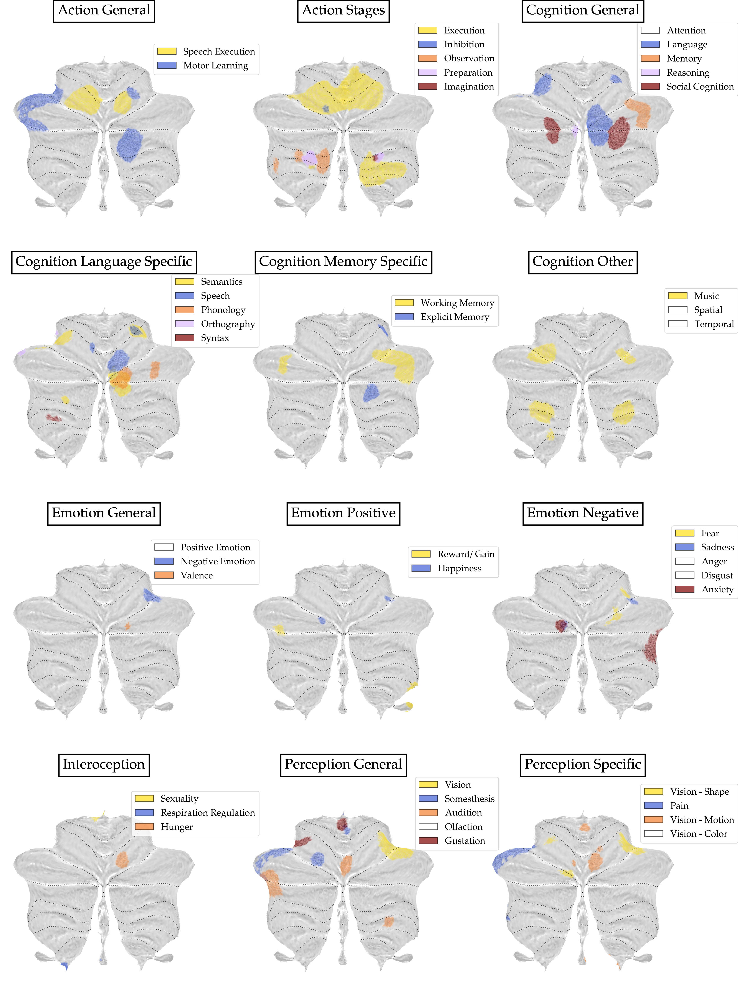

In [18]:
# Create a figure with a grid layout
fig = plt.figure(figsize=(21, 30))

# Loop over each semantic category
for i, (semantic_category, subdomains_in_category) in islice(enumerate(semantic_categories.items()), 12):
    ax = fig.add_subplot(4, 3, i + 1)

    # Filter subdomain_exps based on the subdomains in the current category and convert to Series
    subdomain_exps_in_category = {subdomain: subdomain_exps[subdomain] for subdomain in subdomains_in_category}

    # Create a Series with filtered subdomain_exps and sort by values in descending order
    subdomain_order_semantic_category = pd.Series(subdomain_exps_in_category).sort_values(ascending=False).index

    # Increase the alpha value to make the background less transparent
    grays_mild = LinearSegmentedColormap.from_list(
        'grays_mild', 
        [
            (1, 1, 1, 1), 
            (0.7, 0.7, 0.7, 1)  # to make bg grayer, change 0.7 to lower values
        ]
    )

    # Plot the background
    SUITPy.flatmap.plot(surf_zmaps_thr_strict['Cognition.Language'] * np.NaN, # This can be any map, but make sure to multiply by NaNs.
                        colorbar=False, new_figure=False, bordersize=0.5, 
                        undermap=grays_mild
                    )

    # Use 'tab10' colormap for distinct colors. We did so above; any cmap of preferencecan be used.
    clusters_cmap = chosen_cmap
    clusters_colors = np.array([clusters_cmap(i) for i in range(clusters_cmap.N)])
    bg_color = (1, 1, 1, 0) # transparent white at the lower end of all cmaps
    clusters_colors[:, 3] = 0.2 # make cluster colors transparent. increase this to make clusters less transparent

    clusters_colors[3, 3] = 0.5  # Increased the alpha value for the 4th color (it is quite a faint pinkish hue)

    # Initialize a list to store legend handles
    legend_handles = []

    # Overlay clusters in a loop matching keys for subdomains to the semantic category they belong to
    for i, subdomain in enumerate(subdomain_order_semantic_category):
        matching_keys = [key for key in surf_zmaps_thr_strict.keys() if key.endswith(subdomain)]

        if matching_keys:
            cmap = LinearSegmentedColormap.from_list('cluster', [bg_color, clusters_colors[i]])
            curr_surf = surf_zmaps_thr_strict[matching_keys[0]] > 0
            SUITPy.flatmap.plot(curr_surf, 
                                colorbar=False, new_figure=False, bordersize=0, 
                                backgroundcolor=(0, 0, 0, 0), 
                                bordercolor='black',
                                underlay=np.zeros_like(curr_surf),
                                cmap=cmap, 
                            )

            # Add the semantic category title above the existing labels
            category_title = semantic_category.replace('_', ' ').title()
            ax.text(0.5, 1.10, f'{category_title}', fontsize=24, fontweight='bold', ha='center', va='center', transform=ax.transAxes, color='black', bbox=dict(facecolor='none', edgecolor='black', linewidth=2, pad = 7))  # Adjust linewidth value here

            # Check if curr_surf has all zeroes
            if np.all(curr_surf == 0):
                # Add a horizontal rectangle handle to the legend_handles list.  For empty maps it will be white.
                legend_handles.append(ax.bar(0, 0, color='white', edgecolor='black', alpha = 0.7, label=f"{subdomain_labels[subdomain]}")) # Remove subdomain N so we can size-up the subdomain labels.
            else:
                # Add the regular legend handle for non-zero cases. These will be colored by their index within the semantic category (1-5).
                legend_handles.append(ax.bar(0, 0, color=clusters_colors[i], edgecolor='black', alpha = 0.7, label=f"{subdomain_labels[subdomain]}"))
        else:
            # Handle the case when no matching key is found.
            print(f"No matching key found for subdomain: {subdomain}")

    # Create a legend with the legend handles
    legend = ax.legend(handles=legend_handles,
                    loc='center right', bbox_to_anchor=(1.30, 0.87), prop={'size': 16})

# Show the entire figure containing all subplots
plt.show()


In [ ]:
# Decide if you want to save the figure
# fig.savefig(os.path.join(BASE_DIR, 'Figures/SALE_maps/Figure2/SALE-Subd-Thre-conservative_Fig2-largerLabels.png'), bbox_inches='tight')

# (Not used) Figure 2 with leniently-thresholded clusters (p < 0.01 and k = 50)

/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py:483: RuntimeWarning: All-NaN slice encountered
  cscale = np.array([np.nanmin(data), np.nanmax(data)])
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/SUITPy/flatmap.py

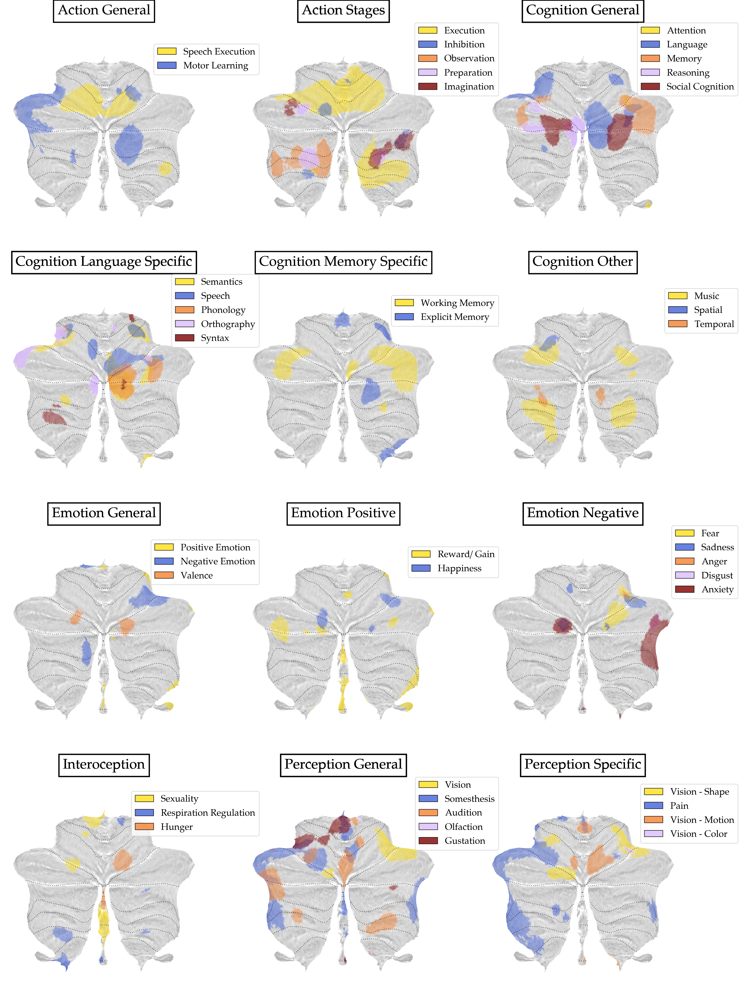

In [20]:
import matplotlib.pyplot as plt
from itertools import islice

# Create a figure with a grid layout
fig = plt.figure(figsize=(21, 30))

# Loop over each semantic category
for i, (semantic_category, subdomains_in_category) in islice(enumerate(semantic_categories.items()), 12):
    ax = fig.add_subplot(4, 3, i + 1)

    # Filter subdomain_exps based on the subdomains in the current category and convert to Series
    subdomain_exps_in_category = {subdomain: subdomain_exps[subdomain] for subdomain in subdomains_in_category}

    # Create a Series with filtered subdomain_exps and sort by values in descending order
    subdomain_order_semantic_category = pd.Series(subdomain_exps_in_category).sort_values(ascending=False).index

    # Increase the alpha value to make the background less transparent
    grays_mild = LinearSegmentedColormap.from_list(
        'grays_mild', 
        [
            (1, 1, 1, 1), 
            (0.7, 0.7, 0.7, 1)  # to make bg grayer, change 0.7 to lower values.
        ]
    )

    # Plot the background
    SUITPy.flatmap.plot(surf_zmaps_thr['Cognition.Language'] * np.NaN, 
                        colorbar=False, new_figure=False, bordersize=0.5, 
                        undermap=grays_mild
                    )

    # Used 'tab10' colormap. Use any cmap of your preference.
    clusters_cmap = chosen_cmap
    clusters_colors = np.array([clusters_cmap(i) for i in range(clusters_cmap.N)])
    bg_color = (1, 1, 1, 0) # transparent white at the lower end of all cmaps
    clusters_colors[:, 3] = 0.2 # make cluster colors transparent. increase this to make clusters less transparent.

    clusters_colors[3, 3] = 0.5  # Adjust the alpha value for the 4th color (it is quite a faint pinkish hue).

    # Create an empty list to store legend handles.
    legend_handles = []

    # Overlay clusters in a loop matching keys for subdomains to the semantic category they belong to.
    for i, subdomain in enumerate(subdomain_order_semantic_category):
        matching_keys = [key for key in surf_zmaps_thr.keys() if key.endswith(subdomain)]

        if matching_keys:
            cmap = LinearSegmentedColormap.from_list('cluster', [bg_color, clusters_colors[i]])
            curr_surf = surf_zmaps_thr[matching_keys[0]] > 0
            SUITPy.flatmap.plot(curr_surf, 
                                colorbar=False, new_figure=False, bordersize=0, 
                                backgroundcolor=(0, 0, 0, 0), 
                                bordercolor='black',
                                underlay=np.zeros_like(curr_surf),
                                cmap=cmap, 
                            )

            # Add the semantic category title above the existing labels
            category_title = semantic_category.replace('_', ' ').title()
            ax.text(0.5, 1.10, f'{category_title}', fontsize=24, fontweight='bold', ha='center', va='center', transform=ax.transAxes, color='black', bbox=dict(facecolor='none', edgecolor='black', linewidth=2, pad = 7))  # Adjust linewidth value here

            # Check if curr_surf has all zeroes
            if np.all(curr_surf == 0):
                # Add a horizontal rectangle handle to the legend_handles list. For empty maps it will be white.
                legend_handles.append(ax.bar(0, 0, color='white', edgecolor='black', alpha= 0.8, label=f"{subdomain_labels[subdomain]})")) # (N = {subdomain_exps[subdomain]}, add the number of experiments if desired.
            else:
                # Add the regular legend handle for non-zero cases.  These will be colored by their index within the semantic category (1-5).
                legend_handles.append(ax.bar(0, 0, color=clusters_colors[i], edgecolor='black', alpha= 0.8,label=f"{subdomain_labels[subdomain]}")) #  (N = {subdomain_exps[subdomain]})
        else:
            # Handle the case when no matching key is found.
            print(f"No matching key found for subdomain: {subdomain}")

    # Create a legend with the legend handles
    legend = ax.legend(handles=legend_handles,
                    loc='center right', bbox_to_anchor=(1.30, 0.87), prop={'size': 16})

# Show the entire figure containing all subplots
plt.show()

In [21]:
# Decide if you want to save the figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/SALE_maps/Figure2/SALE-Subd-Thre-Fig2-largerLabels.png'), bbox_inches='tight')